## Conversion Scripts to make cutdown files



In [ ]:
# # UMAP selective
# umap_selective = umap[umap.index.str.contains("TMAC_")]
# # Save expr to CSV
# umap_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAC_umap_transposed.csv")

# # UMAP selective
# umap_selective = umap[umap.index.str.contains("TMAB_")]
# # Save expr to CSV
# umap_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAB_umap_transposed.csv")

# # UMAP selective
# umap_selective = umap[umap.index.str.contains("TMAA_")]
# # Save expr to CSV
# umap_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAA_umap_transposed.csv")


# # metadata selective
# metadata_selective = metadata[metadata.index.str.contains("TMAC_")]
# # Save expr to CSV
# metadata_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAC_meta_transposed.csv")

# # metadata selective
# metadata_selective = metadata[metadata.index.str.contains("TMAB_")]
# # Save expr to CSV
# metadata_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAB_meta_transposed.csv")

# # metadata selective
# metadata_selective = metadata[metadata.index.str.contains("TMAA_")]
# # Save expr to CSV
# metadata_selective.to_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMAA_meta_transposed.csv")

## Laptop mRNA Analysis

Given there size this need to be cutdown files so I can only do TMA A, B, or C. 


In [168]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np

TMA_Core="A" # Should be A,B,C 

#Load files on laptop
expr= pd.read_csv(fr"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNAexpression_TMA{TMA_Core}_transposed.csv", index_col=0)
#expr=expr_orig.transpose()
metadata = pd.read_csv(fr"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMA{TMA_Core}_meta_transposed.csv", index_col=0)
umap = pd.read_csv(fr"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\Laptop Cutdown RNA Files\RNA_TMA{TMA_Core}_umap_transposed.csv", index_col=0)

# Create AnnData object
adata = sc.AnnData(X=expr.values)

# Assign metadata
adata.obs = metadata
adata.var_names = expr.columns
adata.obs_names = expr.index

# Add spatial coordinates and UMAP to .obsm
adata.obsm["spatial"] = metadata[['x_pixel', 'y_pixel']].values  # adjust if needed
# x_pixel, y_pixel, x_norm	y_norm	x_micron	y_micron x_cent	y_cent

adata.obsm["X_umap"] = umap.values

## mRNA Static Plots

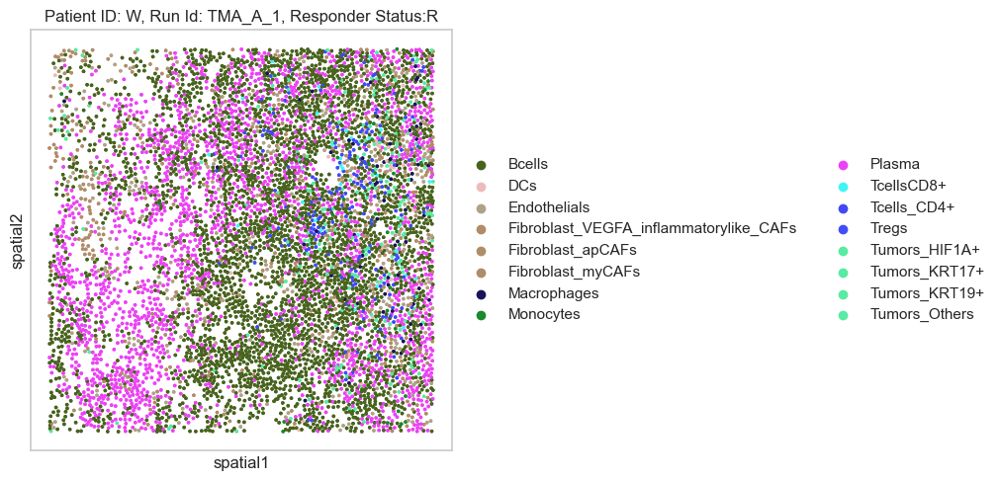

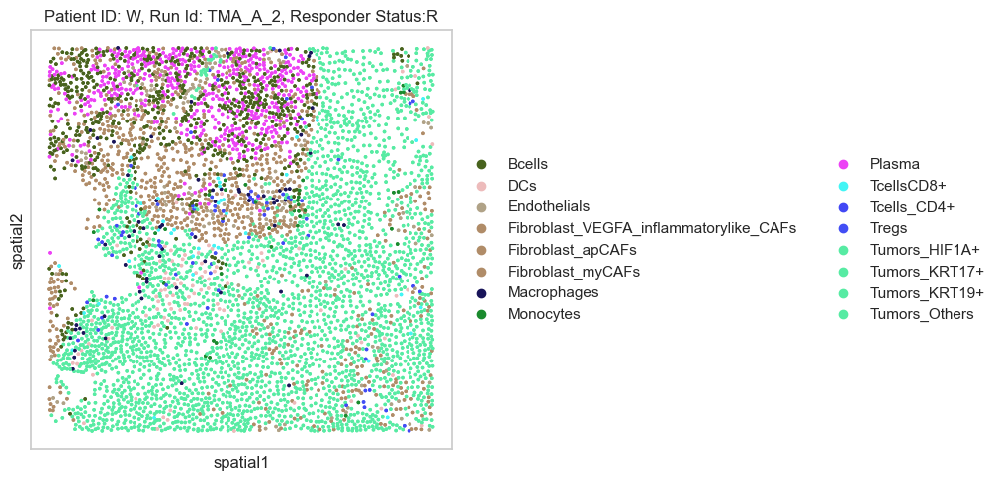

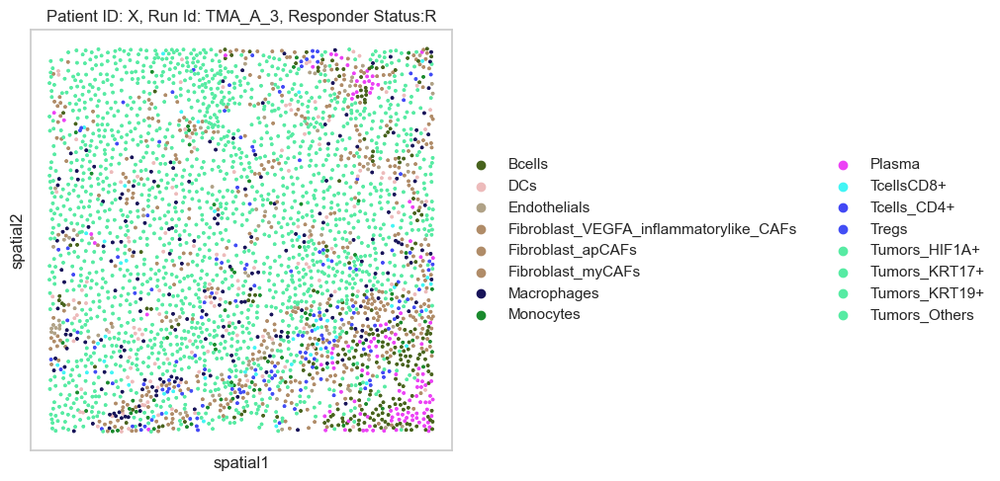

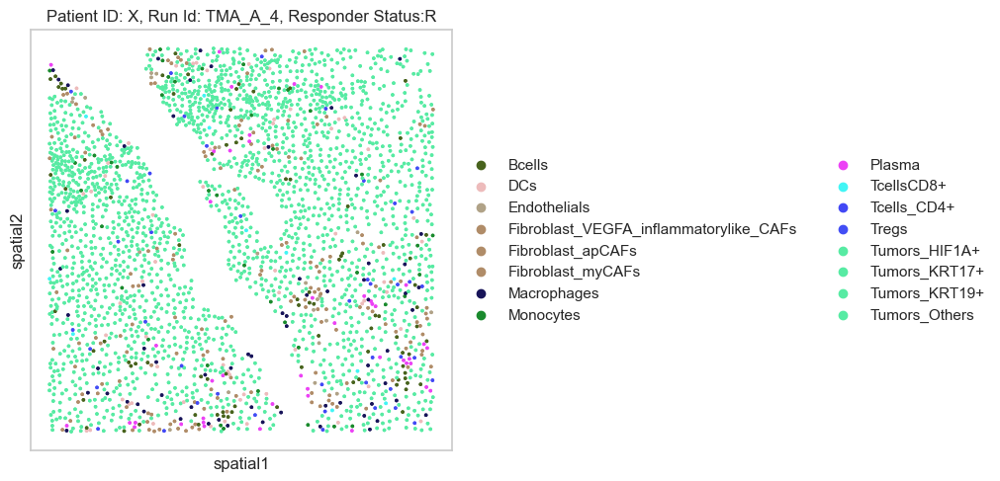

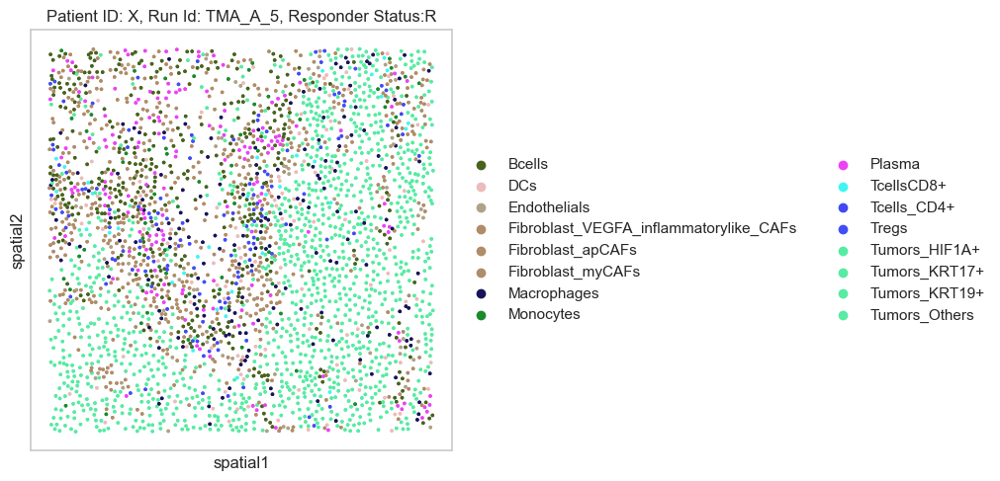

...

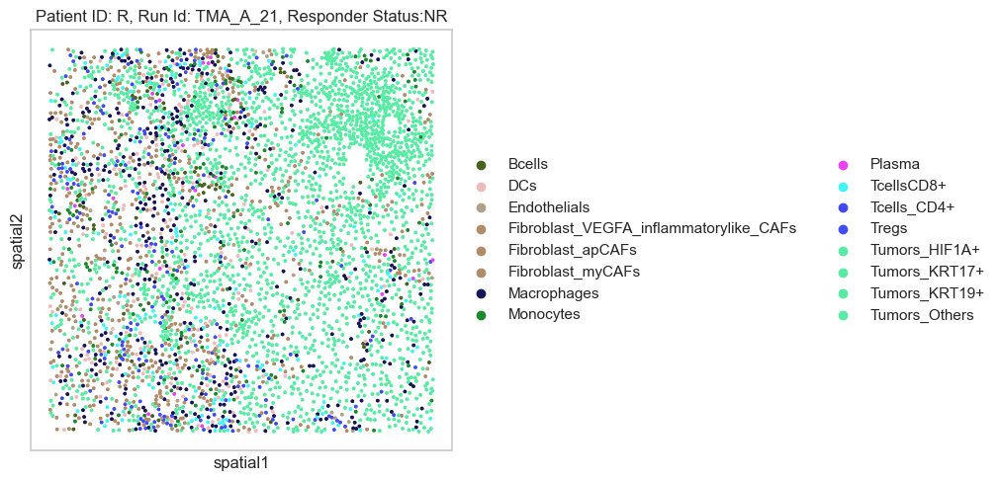

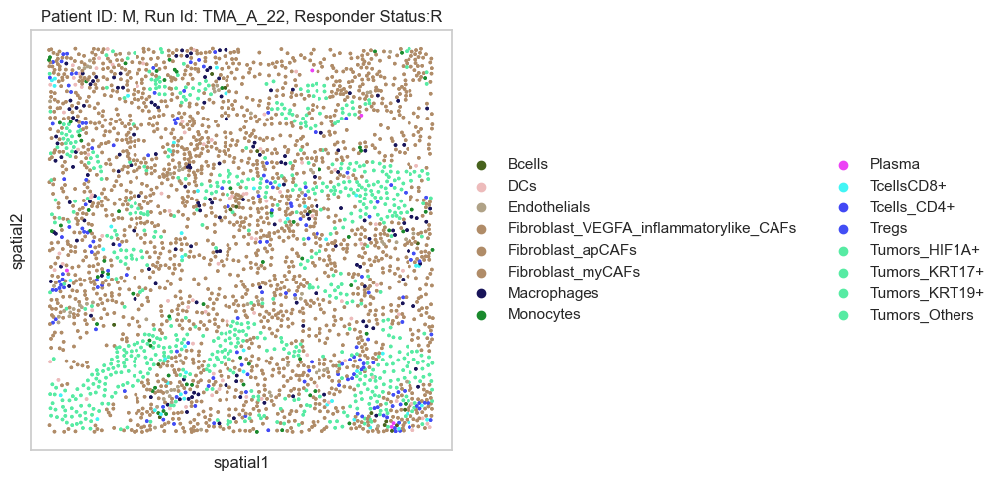

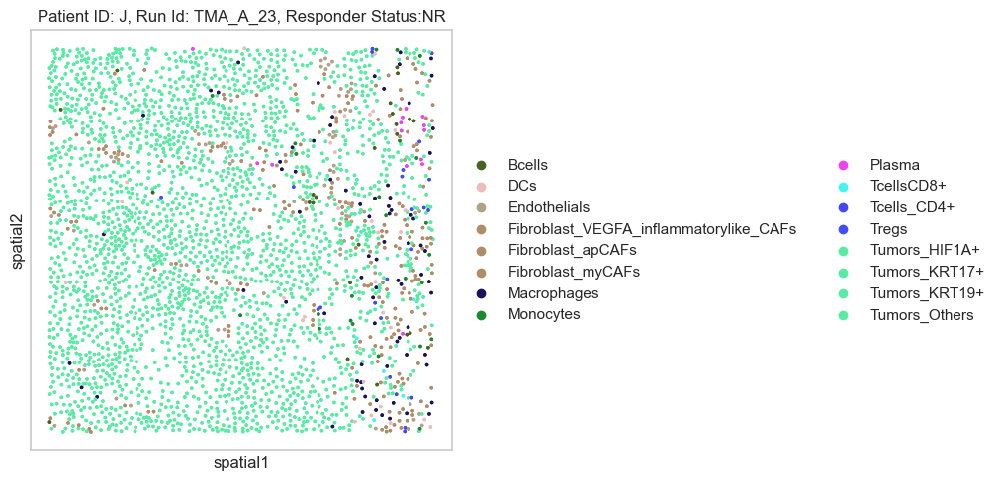

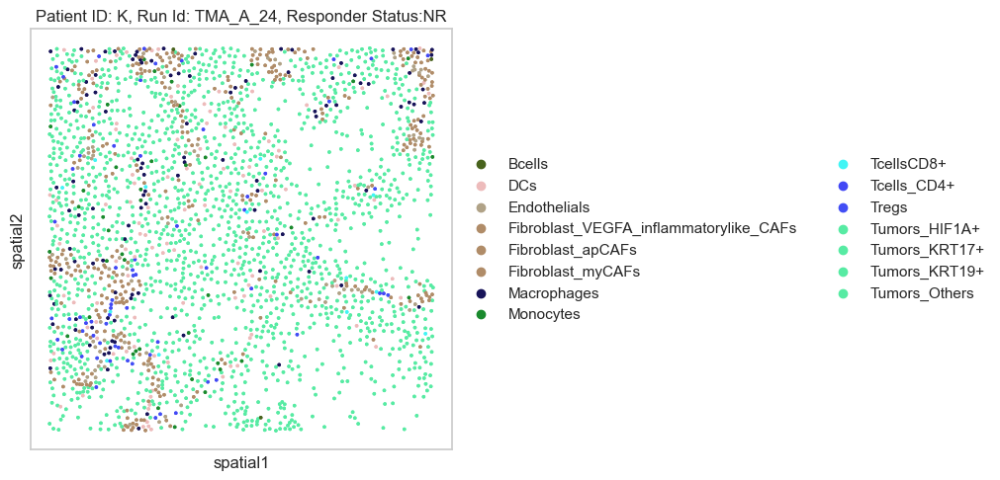

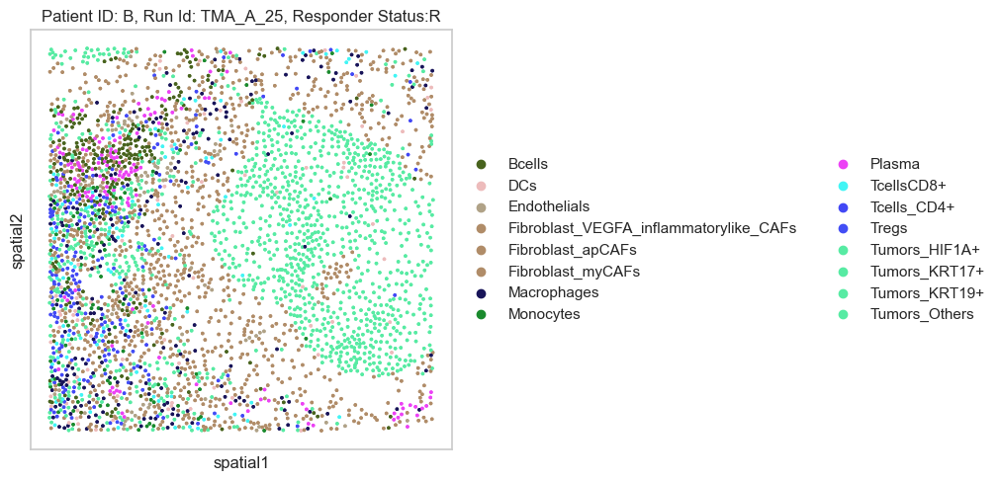

In [123]:
import squidpy as sq
import warnings
warnings.filterwarnings("ignore")

# Color scheme
BCELL_COLOR = "#48631d"
CD4_COLOR = "#42f5f5"
CD8_COLOR = "#4248f5"
DCs_COLOR = "#edbbbb"
FIBROBLASTS_COLOR = "#b08c68"
MACROPHAGE_COLOR = "#181459"
MONOCYTES_COLOR = "#1a8a2d"
NK_COLOR = "#f542bf"
PLASMA_COLOR = "#ec42f5"
TREG_COLOR = "#424ef5"
TUMOR_COLOR = "#57eba3"
ENDO_COLOR = "#b0a287"
OTHER_COLOR = "#d9d9d9"
FIBROBLAST_VEGFA_COLOR = "#b08c68"
FIBROBLAST_APCAFS_COLOR = "#b08c68"
FIBROBLAST_MYCAFS_COLOR = "#b08c68"
TUMORS_HIF1A_COLOR = "#57eba3"
TUMORS_KRT17_COLOR = "#57eba3"
TUMORS_KRT19_COLOR = "#57eba3"
TUMORS_OTHER_COLOR = "#57eba3"

# Full color mapping
cell_type_colors = {
    "Bcells": BCELL_COLOR,
    "TcellsCD8+": CD4_COLOR,
    "Tcells_CD4+": CD8_COLOR,
    "DCs": DCs_COLOR,
    "Fibroblasts/SMCs": FIBROBLASTS_COLOR,
    "Macrophages": MACROPHAGE_COLOR,
    "Monocytes": MONOCYTES_COLOR,
    "NK_cells": NK_COLOR,
    "Plasma": PLASMA_COLOR,
    "Tregs": TREG_COLOR,
    "Endothelials": ENDO_COLOR,
    "Fibroblast_myCAFs": FIBROBLAST_MYCAFS_COLOR,
    "Fibroblast_apCAFs": FIBROBLAST_APCAFS_COLOR,
    "Fibroblast_VEGFA_inflammatorylike_CAFs": FIBROBLAST_VEGFA_COLOR,
    "Tumors_HIF1A+": TUMORS_HIF1A_COLOR,
    "Tumors_KRT17+": TUMORS_KRT17_COLOR,
    "Tumors_KRT19+": TUMORS_KRT19_COLOR,
    "Tumors_Others": TUMORS_OTHER_COLOR
}

TMA_ids=[f"{TMA_Core}"]

for j in TMA_ids:
    for i in range(1, 50):
        cell_ID_like =f"TMA_{j}_FOV{i}(?!\d)"
        subset = adata[adata.obs.tma_fov_id.str.contains(cell_ID_like)]
        
        # Skip if no matching cells are found
        if subset.n_obs == 0:
            continue
    
        # Get the unique patient ID (assumes only one per subset)
        patient_id = subset.obs["PatientID"].unique()[0]
        response_status = subset.obs["Response"].unique()[0]

        # Convert to categorical without setting all 12 types
        subset.obs["annot_cluster2"] = subset.obs["annot_cluster2"].astype("category")

        # Get the actual order of categories used in the subset
        category_order = subset.obs["annot_cluster2"].cat.categories.tolist()
        
        # Generate color list in the exact same order
        color_list = [
            cell_type_colors.get(ct, OTHER_COLOR)
            for ct in category_order
        ]

        # Set the colors in the correct order
        subset.uns["annot_cluster2_colors"] = color_list
        
        # Plot with dynamic title
        sq.pl.spatial_scatter(
            subset,
            shape=None,
            color="annot_cluster2",
            size=10,
            title=f"Patient ID: {patient_id}, Run Id: TMA_{j}_{i}, Responder Status:{response_status}",
            figsize=(10, 8),  # or larger
            legend_loc='right margin'  # move legend out of plot area
        )

## Interactive mRNA plots

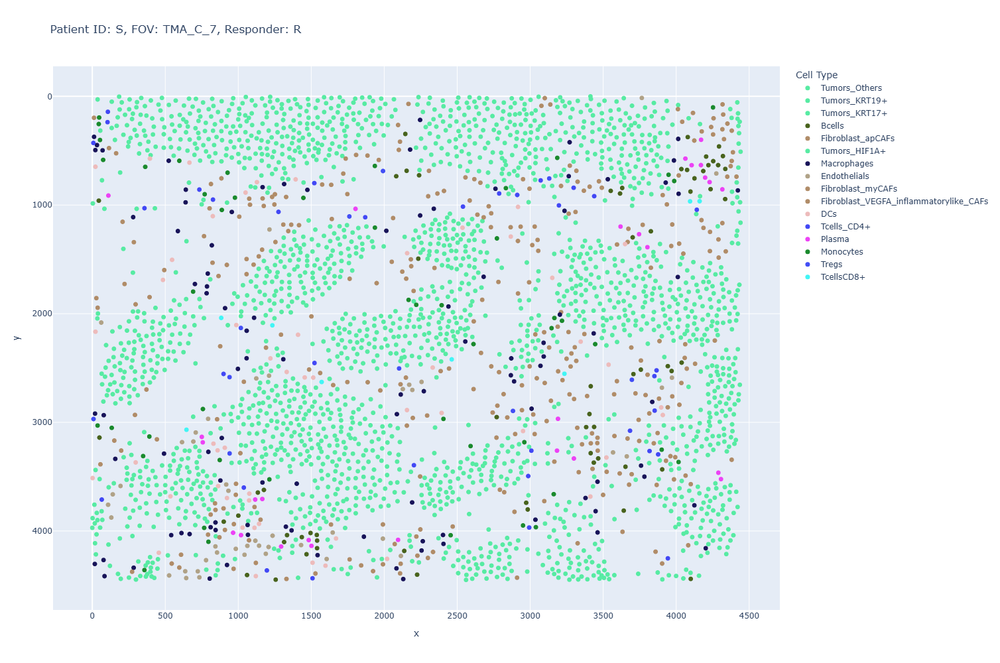

In [162]:
import plotly.express as px
import pandas as pd
import re
import warnings

warnings.filterwarnings("ignore")

# Color scheme
cell_type_colors = {
    "Bcells": "#48631d",
    "TcellsCD8+": "#42f5f5",
    "Tcells_CD4+": "#4248f5",
    "DCs": "#edbbbb",
    "Fibroblasts/SMCs": "#b08c68",
    "Macrophages": "#181459",
    "Monocytes": "#1a8a2d",
    "NK_cells": "#f542bf",
    "Plasma": "#ec42f5",
    "Tregs": "#424ef5",
    "Endothelials": "#b0a287",
    "Fibroblast_myCAFs": "#b08c68",
    "Fibroblast_apCAFs": "#b08c68",
    "Fibroblast_VEGFA_inflammatorylike_CAFs": "#b08c68",
    "Tumors_HIF1A+": "#57eba3",
    "Tumors_KRT17+": "#57eba3",
    "Tumors_KRT19+": "#57eba3",
    "Tumors_Others": "#57eba3"
}
OTHER_COLOR = "#d9d9d9"

# Genes to overlay in hover
genes_to_add = ["CSF3R", "ELANE", "CAMP", "FPR1", "KRT19"]
TMA_ids = [f"{TMA_Core}"]

for j in TMA_ids:
    for i in range(7, 8):
        cell_ID_like = f"TMA_{j}_FOV{i}(?!\\d)"
        matches = adata.obs.tma_fov_id.str.contains(cell_ID_like, regex=True)
        subset = adata[matches]

        if subset.n_obs == 0:
            continue

        # Extract metadata
        patient_id = subset.obs["PatientID"].unique()[0]
        response_status = subset.obs["Response"].unique()[0]

        # Ensure categorical cluster info
        cluster_col = "annot_cluster2"
        subset.obs[cluster_col] = subset.obs[cluster_col].astype("category")
        category_order = subset.obs[cluster_col].cat.categories.tolist()

        # Get color list
        color_list = [cell_type_colors.get(ct, OTHER_COLOR) for ct in category_order]
        subset.uns[f"{cluster_col}_colors"] = color_list

        # Spatial coords
        spatial_coords = subset.obsm["spatial"]
        cluster_labels = subset.obs[cluster_col].tolist()

        # Add gene expression values
        gene_data = {}
        for gene in genes_to_add:
            if gene in subset.var_names:
                gene_values = subset[:, gene].X.toarray().flatten() if hasattr(subset[:, gene].X, "toarray") else subset[:, gene].X.flatten()
                gene_data[gene] = gene_values
            else:
                gene_data[gene] = [None] * subset.n_obs  # Missing gene fallback

        # Build dataframe
        df = pd.DataFrame({
            "x": spatial_coords[:, 0],
            "y": spatial_coords[:, 1],
            "cell_type": cluster_labels,
            "color": [cell_type_colors.get(c, OTHER_COLOR) for c in cluster_labels],
            "PatientID": patient_id,
            "ResponderStatus": response_status,
            "cell_ID": subset.obs.index.to_series().str.split(".").str[-1].values
        })
        # Append gene expression columns
        for gene in genes_to_add:
            df[gene] = gene_data[gene]

        # Interactive plot
        fig = px.scatter(
            df,
            x="x",
            y="y",
            color="cell_type",
            color_discrete_map=cell_type_colors,
            #hover_data=["cell_ID", "cell_type", "PatientID", "ResponderStatus"] + genes_to_add,
            hover_data=["cell_ID", "cell_type", "PatientID", "ResponderStatus", "cell_ID"],
            title=f"Patient ID: {patient_id}, FOV: TMA_{j}_{i}, Responder: {response_status}"
        )
        fig.update_traces(marker=dict(size=7))
        fig.update_layout(
            width=1200,
            height=1000,
            legend_title="Cell Type"
        )
        fig.update_yaxes(autorange="reversed")
        fig.show()


## Measuring protein expression suspected PMNs

In [170]:
import pandas as pd

sample_id="TMA_A_FOV19"

# Sample C_7
# Get rectangle list
# cell_list=rna_create_rectangles(adata,"C_362_7","C_70_7","TMA_C_FOV7")["Cell List"]
# cell_list.extend(rna_create_rectangles(adata,"C_2726_7","C_1257_7","TMA_C_FOV7")["Cell List"])
# cell_list.extend(rna_create_rectangles(adata,"C_2911_7","C_1547_7","TMA_C_FOV7")["Cell List"])

# #sample A_18
# cell_list=rna_create_rectangles(adata,"A_3015_18","A_2013_18","TMA_A_FOV18")["Cell List"]

#Sample A_19
cell_list=rna_create_rectangles(adata,"A_4126_19","A_3646_19","TMA_A_FOV19")["Cell List"]
cell_list.extend(rna_create_rectangles(adata,"A_2753_19","A_1948_19","TMA_A_FOV19")["Cell List"])
cell_list.extend(rna_create_rectangles(adata,"A_2358_19","A_107_19","TMA_A_FOV19")["Cell List"])

display(cell_list)
# Show average gene expression by cell type. There are 1000 genes but showing them all my be hard. may try showing expression of only the first 20 most expressed in the overall sample plus 
import pandas as pd
    
results_rect=extract_gene_expression_table_rectangles(adata,cell_list,sample_id)["Average Matrix"]
results_excluded=extract_gene_expression_table_rectangles_excluded(adata,cell_list,"TMA_A_FOV18")["Average Matrix"]
# results=pd.DataFrame(results)

#Full Matrices for stat tests
results_rect_full=extract_gene_expression_table_rectangles(adata,cell_list,sample_id)["Expression Matrix"]
macrophage_expr_rect = results_rect_full[results_rect_full["cell_type"] == "Macrophages"]
monocytes_expr_rect = results_rect_full[results_rect_full["cell_type"] == "Monocytes"]

results_excluded_full=extract_gene_expression_table_rectangles_excluded(adata,cell_list,sample_id)["Expression Matrix"]
macrophage_expr_excluded = results_excluded_full[results_excluded_full["cell_type"] == "Macrophages"]
monocytes_expr_excluded = results_excluded_full[results_excluded_full["cell_type"] == "Monocytes"]

#Combine matrices
# Add group column
macrophage_expr_rect["group"] = "rect"
macrophage_expr_excluded["group"] = "excluded"
monocytes_expr_rect["group"] = "rect"
monocytes_expr_excluded["group"] = "excluded"

# Combine the two into one DataFrame
macrophage_combined = pd.concat([macrophage_expr_rect, macrophage_expr_excluded])
monocytes_combined = pd.concat([monocytes_expr_rect, monocytes_expr_excluded])

# Optional: reset index
macrophage_combined = macrophage_combined.reset_index(drop=True)
monocytes_combined = monocytes_combined.reset_index(drop=True)

display(macrophage_combined)
display(monocytes_combined)
#display(macrophage_expr_excluded)

['__Run5607.TMAA_778_19',
 '__Run5607.TMAA_780_19',
 '__Run5607.TMAA_782_19',
 '__Run5607.TMAA_783_19',
 '__Run5607.TMAA_784_19',
 '__Run5607.TMAA_795_19',
 '__Run5607.TMAA_797_19',
 '__Run5607.TMAA_817_19',
 '__Run5607.TMAA_826_19',
 '__Run5607.TMAA_833_19',
 '__Run5607.TMAA_835_19',
 '__Run5607.TMAA_837_19',
 '__Run5607.TMAA_838_19',
 '__Run5607.TMAA_843_19',
 '__Run5607.TMAA_845_19',
 '__Run5607.TMAA_851_19',
 '__Run5607.TMAA_855_19',
 '__Run5607.TMAA_860_19',
 '__Run5607.TMAA_864_19',
 '__Run5607.TMAA_868_19',
 '__Run5607.TMAA_871_19',
 '__Run5607.TMAA_873_19',
 '__Run5607.TMAA_886_19',
 '__Run5607.TMAA_892_19',
 '__Run5607.TMAA_899_19',
 '__Run5607.TMAA_900_19',
 '__Run5607.TMAA_3646_19',
 '__Run5607.TMAA_3652_19',
 '__Run5607.TMAA_3654_19',
 '__Run5607.TMAA_3655_19',
 '__Run5607.TMAA_3656_19',
 '__Run5607.TMAA_3658_19',
 '__Run5607.TMAA_3659_19',
 '__Run5607.TMAA_3662_19',
 '__Run5607.TMAA_3664_19',
 '__Run5607.TMAA_3665_19',
 '__Run5607.TMAA_3666_19',
 '__Run5607.TMAA_3667_19',


,ABL1,ABL2,ACE,ACE2,ACKR1,ACKR3,ACKR4,ACTA2,ACTG2,ACVR1,...,NegPrb15,NegPrb16,NegPrb18,NegPrb19,NegPrb20,NegPrb21,NegPrb22,NegPrb23,cell_type,group
0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,rect
1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,rect
2,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.693147,Macrophages,rect
3,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.000000,Macrophages,rect
4,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,rect
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,excluded
350,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,excluded
351,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,excluded
352,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,Macrophages,excluded


,ABL1,ABL2,ACE,ACE2,ACKR1,ACKR3,ACKR4,ACTA2,ACTG2,ACVR1,...,NegPrb15,NegPrb16,NegPrb18,NegPrb19,NegPrb20,NegPrb21,NegPrb22,NegPrb23,cell_type,group
0,0.0,0.0,0.0,0.693147,0.000000,0.000000,0.0,1.386294,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,rect
1,0.0,0.0,0.0,0.000000,0.000000,1.386294,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,rect
2,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,rect
3,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,rect
4,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,rect
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,0.0,0.0,0.0,0.000000,1.098612,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,excluded
106,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.693147,0.0,0.0,...,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,Monocytes,excluded
107,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,excluded
108,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.693147,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Monocytes,excluded


## Statistical Tests 

In [172]:
from scipy.stats import mannwhitneyu
import pandas as pd

# Get list of genes (exclude metadata columns)
gene_columns = [col for col in macrophage_combined.columns if col not in ["cell_type", "group"]]

# Get group sizes once
rect_n = macrophage_combined[macrophage_combined["group"] == "rect"].shape[0]
excluded_n = macrophage_combined[macrophage_combined["group"] == "excluded"].shape[0]

# Create list to store results
results = []

# Loop through each gene
for gene in gene_columns:
    group_rect = macrophage_combined[macrophage_combined["group"] == "rect"][gene]
    group_excluded = macrophage_combined[macrophage_combined["group"] == "excluded"][gene]

    # Perform Wilcoxon rank-sum test (Mann-Whitney U test)
    stat, p_value = mannwhitneyu(group_rect, group_excluded, alternative="two-sided")

    results.append({
        "gene": gene,
        "U_statistic": stat,
        "p_value": p_value,
        "rect_mean": group_rect.mean(),
        "excluded_mean": group_excluded.mean()
    })

# Convert results to DataFrame
wilcoxon_results = pd.DataFrame(results)

# Rename the mean columns to include sample size in the **labels only**
wilcoxon_results = wilcoxon_results.rename(columns={
    "rect_mean": f"rect_mean (n={rect_n})",
    "excluded_mean": f"excluded_mean (n={excluded_n})"
})

# Optional: sort by p-value
wilcoxon_results = wilcoxon_results.sort_values("p_value")

# Display top hits
print(wilcoxon_results.head(45))

# Option 2: Display specific genes
genes_of_interest = ["CXCL8", "IL1B", "TNF"]  # customize this list

filtered = wilcoxon_results[wilcoxon_results["gene"].isin(genes_of_interest)]

print("\nResults for genes of interest:\n")
print(filtered)


         gene  U_statistic   p_value  rect_mean (n=79)  excluded_mean (n=275)
634       MGP       8339.5  0.000134          0.165230               0.484655
959   NegPrb3      11708.0  0.000240          0.066551               0.007562
171      CD68      13431.0  0.000915          1.032664               0.722977
241    COL9A1      11471.0  0.001661          0.043870               0.005041
585     KRT20      11471.0  0.001661          0.043870               0.005041
743     PTGES      11372.0  0.001894          0.045361               0.003995
842      SRGN      13142.5  0.002826          0.884784               0.625403
445  HSP90AB1       9183.5  0.003503          0.080457               0.250975
480    IGFBP7       9467.0  0.003736          0.047312               0.180429
490      IL11      12024.5  0.004581          0.171179               0.065477
780     RPL22       9232.0  0.005635          0.108113               0.256238
415       HBB      11334.5  0.008525          0.040229          

In [159]:
from scipy.stats import mannwhitneyu
import pandas as pd

def perform_wilcoxon_test_by_group(cell_matrix, group_col="group", meta_cols=["cell_type", "group"]):
    """
    Perform a Wilcoxon (Mann-Whitney U) test for each gene between two groups in a gene expression matrix.
    
    Parameters:
        cell_matrix (pd.DataFrame): DataFrame with cell_type, group column, and gene expression columns.
        group_col (str): Column name that defines the grouping variable (default: 'group').
        meta_cols (list): List of metadata columns to exclude from gene list (default: ['cell_type', 'group']).
    
    Returns:
        pd.DataFrame: Table with gene name, test statistics, means per group, and p-values.
    """
    gene_columns = [col for col in cell_matrix.columns if col not in meta_cols]
    
    # Identify unique groups
    groups = cell_matrix[group_col].unique()
    if len(groups) != 2:
        raise ValueError("Function currently supports exactly two groups for comparison.")

    group_1, group_2 = groups

    results = []
    for gene in gene_columns:
        data_1 = cell_matrix[cell_matrix[group_col] == group_1][gene]
        data_2 = cell_matrix[cell_matrix[group_col] == group_2][gene]

        # Perform Mann-Whitney U test
        stat, p_value = mannwhitneyu(data_1, data_2, alternative="two-sided")

        results.append({
            "gene": gene,
            "U_statistic": stat,
            "p_value": p_value,
            f"{group_1}_mean": data_1.mean(),
            f"{group_2}_mean": data_2.mean()
        })

    # Build result DataFrame
    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values("p_value")
    
    return result_df

results=perform_wilcoxon_test_by_group(macrophage_combined)
# Display top hits
display(results.head(45))

,gene,U_statistic,p_value,rect_mean,excluded_mean
277,CXCL8,4314.5,0.000847,0.703855,0.282026
20,ADGRE5,3874.5,0.001212,0.161117,0.029494
210,CLEC4A,4016.5,0.001370,0.264352,0.070533
807,SELENOP,2579.0,0.003130,0.158611,0.398049
387,GATA3,3674.0,0.003584,0.058991,0.004780
667,NCR1,3674.0,0.003584,0.058991,0.004780
609,LGALS9,2842.5,0.005381,0.014748,0.151354
842,SRGN,4241.5,0.009062,0.989803,0.674380
433,HLA-DQA1,2575.0,0.009159,0.502582,0.794365
373,FPR1,3973.5,0.009217,0.270473,0.111127


### Plots Box and Violin

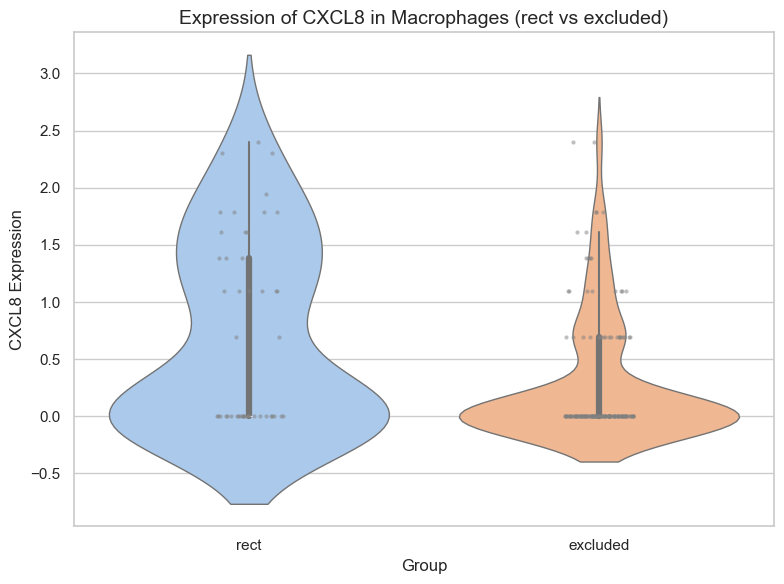

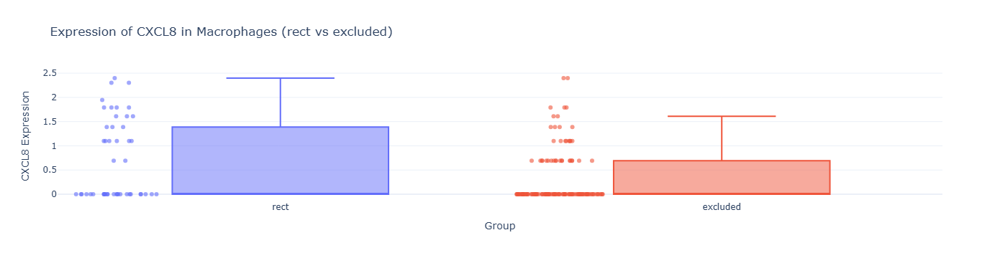

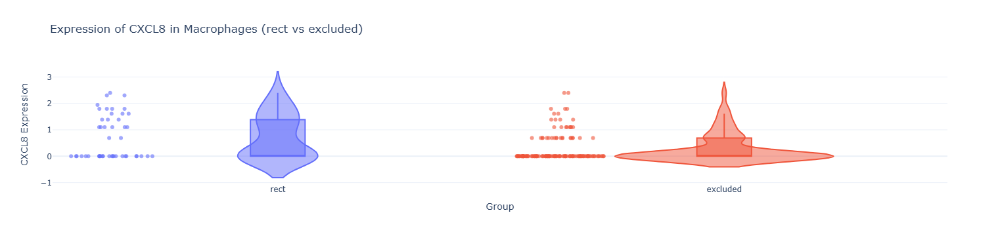

In [160]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

# Marker to plot
top_marker = "CXCL8"

# Cell Group to Plot
plot_cell_type=macrophage_combined

# Non-Interactive Violin Plot
plot_violin_expression(plot_cell_type, top_marker)

# Call the interactive box and violin plots
plot_interactive_boxplot(plot_cell_type, top_marker)
plot_interactive_violinplot(plot_cell_type, top_marker)


## Function List

This is a list of the mRNA functions that will eventually be added to the overall my_functions page. Could be cool. 

In [136]:
def is_point_in_bounds(x, y, x1, y1, x2, y2):
    """
    Returns True if (x, y) lies within the rectangle defined by (x1, y1) and (x2, y2)
    regardless of the order of the corners.
    """
    x_min, x_max = sorted([x1, x2])
    y_min, y_max = sorted([y1, y2])

    return x_min <= x <= x_max and y_min <= y <= y_max

def rna_create_rectangles(adata,cell_id_1,cell_id_2,sample_id):
    cell_list=[]

    rna_subset = adata[adata.obs.tma_fov_id == sample_id]

    #Loop to find the x and y coords. Def not the smartest way to do this but it is simiple
    for cell_id, row in rna_subset.obs.iterrows():
        if cell_id_1 in cell_id:
            x1=row["x_pixel"]
            y1=row["y_pixel"]
        if cell_id_2 in cell_id:
            x2=row["x_pixel"]
            y2=row["y_pixel"]

    for cell_id, row in rna_subset.obs.iterrows():
        x=row["x_pixel"]
        y=row["y_pixel"]
        if is_point_in_bounds(x, y, x1, y1, x2, y2)==True:
            cell_list.append(cell_id)
    return{
        "Cell List":cell_list
    }
def extract_gene_expression_table_rectangles_excluded(adata, cell_ids, sample_id):
    """
    Given an AnnData object and a list of cell IDs (obs_names),
    return a DataFrame with gene expression values of cells not in the cell_ids for comparison
    
    Parameters:
    - adata: AnnData object
    - cell_ids: list of cell IDs (obs_names)
    - cluster_column: column in adata.obs containing cell type info (default: "annot_cluster2")
    
    Returns:
    - DataFrame: rows = cell IDs, columns = genes + 'cell_type'
    """

    cluster_column="annot_cluster2"
    
    # Exclude cells in cell_list
    adata_sample= adata[adata.obs.tma_fov_id == sample_id]
    adata_subset = adata_sample[~adata_sample.obs_names.isin(cell_ids)]

    # Get gene expression matrix
    expr_matrix = adata_subset.X
    if hasattr(expr_matrix, "toarray"):  # If sparse, convert to dense
        expr_matrix = expr_matrix.toarray()

    # Create expression DataFrame
    expr_excluded_df = pd.DataFrame(expr_matrix, index=adata_subset.obs_names, columns=adata_subset.var_names)

    # Add cell type column
    expr_excluded_df["cell_type"] = adata_subset.obs["annot_cluster2"].values

    # Compute mean expression by cell type
    avg_expr = expr_excluded_df.groupby("cell_type").mean()
    
    # Count number of cells per cell type
    cell_counts = expr_excluded_df["cell_type"].value_counts().sort_index()
    
    # Create new index with cell type + (n=...)
    new_index = [f"{cell_type} (n={cell_counts[cell_type]})" for cell_type in avg_expr.index]
    
    # Assign the new index to the averaged expression table
    avg_expr.index = new_index

    return {
        "Expression Matrix":expr_excluded_df,
        "Average Matrix":avg_expr
    }
def extract_gene_expression_table_rectangles(adata, cell_ids,sample_id):
    """
    Given an AnnData object and a list of cell IDs (obs_names),
    return a DataFrame with gene expression values and cell type.
    
    Parameters:
    - adata: AnnData object
    - cell_ids: list of cell IDs (obs_names)
    - cluster_column: column in adata.obs containing cell type info (default: "annot_cluster2")
    
    Returns:
    - DataFrame: rows = cell IDs, columns = genes + 'cell_type'
    """

    cluster_column="annot_cluster2"
    
    # Subset AnnData
    adata_sample= adata[adata.obs.tma_fov_id == sample_id]
    adata_subset = adata_sample[cell_ids]

    # Get gene expression matrix
    expr_matrix = adata_subset.X
    if hasattr(expr_matrix, "toarray"):  # If sparse, convert to dense
        expr_matrix = expr_matrix.toarray()

    # Create expression DataFrame
    expr_df = pd.DataFrame(expr_matrix, index=adata_subset.obs_names, columns=adata_subset.var_names)

    # Add cell type column
    expr_df["cell_type"] = adata_subset.obs["annot_cluster2"].values

    # Compute mean expression by cell type
    avg_expr = expr_df.groupby("cell_type").mean()
    
    # Count number of cells per cell type
    cell_counts = expr_df["cell_type"].value_counts().sort_index()
    
    # Create new index with cell type + (n=...)
    new_index = [f"{cell_type} (n={cell_counts[cell_type]})" for cell_type in avg_expr.index]
    
    # Assign the new index to the averaged expression table
    avg_expr.index = new_index

    return {
        "Expression Matrix":expr_df,
        "Average Matrix":avg_expr
    }
def perform_wilcoxon_test_by_group(cell_matrix, group_col="group", meta_cols=["cell_type", "group"]):
    """
    Perform a Wilcoxon (Mann-Whitney U) test for each gene between two groups in a gene expression matrix.
    
    Parameters:
        cell_matrix (pd.DataFrame): DataFrame with cell_type, group column, and gene expression columns.
        group_col (str): Column name that defines the grouping variable (default: 'group').
        meta_cols (list): List of metadata columns to exclude from gene list (default: ['cell_type', 'group']).
    
    Returns:
        pd.DataFrame: Table with gene name, test statistics, means per group, and p-values.
    """
    gene_columns = [col for col in cell_matrix.columns if col not in meta_cols]
    
    # Identify unique groups
    groups = cell_matrix[group_col].unique()
    if len(groups) != 2:
        raise ValueError("Function currently supports exactly two groups for comparison.")

    group_1, group_2 = groups

    results = []
    for gene in gene_columns:
        data_1 = cell_matrix[cell_matrix[group_col] == group_1][gene]
        data_2 = cell_matrix[cell_matrix[group_col] == group_2][gene]

        # Perform Mann-Whitney U test
        stat, p_value = mannwhitneyu(data_1, data_2, alternative="two-sided")

        results.append({
            "gene": gene,
            "U_statistic": stat,
            "p_value": p_value,
            f"{group_1}_mean": data_1.mean(),
            f"{group_2}_mean": data_2.mean()
        })

    # Build result DataFrame
    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values("p_value")
    
    return result_df

def plot_interactive_boxplot(dataframe, gene, group_col="group"):
    """
    Plots an interactive box plot for gene expression across groups.

    Parameters:
        dataframe (pd.DataFrame): DataFrame containing gene expression data.
        gene (str): Gene name to plot (column name in dataframe).
        group_col (str): Column name indicating group classification.
    """
    if gene not in dataframe.columns:
        print(f"Gene '{gene}' not found in dataframe.")
        return

    fig = px.box(
        dataframe,
        x=group_col,
        y=gene,
        points="all",
        color=group_col,
        title=f"Expression of {gene} in Macrophages (rect vs excluded)",
        labels={group_col: "Group", gene: f"{gene} Expression"},
        template="plotly_white"
    )
    fig.update_traces(marker=dict(size=6, opacity=0.6), jitter=0.4)
    fig.update_layout(showlegend=False)
    fig.show()


def plot_interactive_violinplot(dataframe, gene, group_col="group"):
    """
    Plots an interactive violin plot for gene expression across groups.

    Parameters:
        dataframe (pd.DataFrame): DataFrame containing gene expression data.
        gene (str): Gene name to plot (column name in dataframe).
        group_col (str): Column name indicating group classification.
    """
    if gene not in dataframe.columns:
        print(f"Gene '{gene}' not found in dataframe.")
        return

    fig = px.violin(
        dataframe,
        x=group_col,
        y=gene,
        points="all",
        box=True,
        color=group_col,
        title=f"Expression of {gene} in Macrophages (rect vs excluded)",
        labels={group_col: "Group", gene: f"{gene} Expression"},
        template="plotly_white"
    )
    fig.update_traces(marker=dict(size=6, opacity=0.6), jitter=0.4)
    fig.update_layout(showlegend=False)
    fig.show()

